In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [34]:
event_id = "G0H12-201804202100"
combined_seq_original = np.load(f"/home/jupyter/halil_debug/ioncastgnn-fulldataset-sunlock-dilation64-nonresidual-Oct-5/test-long-horizon-event-{event_id}-original.npy")
combined_seq_forecast = np.load(f"/home/jupyter/halil_debug/ioncastgnn-fulldataset-sunlock-dilation64-nonresidual-Oct-5/test-long-horizon-event-{event_id}-forecast.npy")

In [5]:
combined_seq_original.shape, combined_seq_forecast.shape

((48, 44, 180, 360), (48, 44, 180, 360))

In [ ]:
"""
JPLD channels:
    - Channel 0 (0): JPLD Dense TEC map.
Sunmoon channels:
    - Channel  0     (1):     Cosine of the Sun's zenith angle map.
    - Channels 1-3   (2-4):   Sun's subsolar point coordinates (normalized lat, cos(lon), sin(lon)).
    - Channels 4-6   (5-7):   Sun's antipode point coordinates (normalized lat, cos(lon), sin(lon)).
    - Channel  7     (8):     Earth-Sun distance (in Astronomical Units, AU).
    - Channel  8     (9):     Cosine of the Moon's zenith angle map.
    - Channels 9-11  (10-12): Moon's sublunar point coordinates (normalized lat, cos(lon), sin(lon)).
    - Channels 12-14 (13-15): Moon's antipode point coordinates (normalized lat, cos(lon), sin(lon)).
    - Channel  15    (16):    Earth-Moon distance (in Lunar Distances, LD).
    - Channels 16-17 (17-18): Cyclical features for the day of the year (sin, cos).

Quasi Dipole channels:
    - Channel 0 (19): Quasi-dipole latitude grid (sin).
    - Channel 1 (20): Quasi-dipole latitude grid (cos).
    - Channel 2 (21): Quasi-dipole longitude grid (sin).
    - Channel 3 (22): Quasi-dipole longitude grid (cos). [Note this channel was actually still the sin of the lon grid in the dataset class just fixed it now (Oct 10, 2025)]

Celestrak channels:
    - Channel 0 (23): Kp index.
    - Channel 1 (24): Ap index.

OMNI channels:
    - Channel 0 (25): omniweb__sym_d__[nT]
    - Channel 1 (26): omniweb__sym_h__[nT]
    - Channel 2 (27): omniweb__asy_d__[nT]
    - Channel 3 (28): omniweb__bx_gse__[nT]
    - Channel 4 (29): omniweb__by_gse__[nT]
    - Channel 5 (30): omniweb__bz_gse__[nT]
    - Channel 6 (31): omniweb__speed__[km/s]
    - Channel 7 (32): omniweb__vx_velocity__[km/s]
    - Channel 8 (33): omniweb__vy_velocity__[km/s]
    - Channel 9 (34): omniweb__vz_velocity__[km/s]

SET channels:
    - Channel 0 (35): space_environment_technologies__f107_obs__
    - Channel 1 (36): space_environment_technologies__f107_average__
    - Channel 2 (37): space_environment_technologies__s107_obs__
    - Channel 3 (38): space_environment_technologies__s107_average__
    - Channel 4 (39): space_environment_technologies__m107_obs__
    - Channel 5 (40): space_environment_technologies__m107_average__
    - Channel 6 (41): space_environment_technologies__y107_obs__
    - Channel 7 (42): space_environment_technologies__y107_average__
    - Channel 8 (43): JB08__d_st_dt__[K]
"""

In [54]:
channels = np.arange(combined_seq_original.shape[1])
channel_names = [ "JPLD_TEC",
                  "Sun_zenith_cos",
                  "Sun_subsolar_lat_sin",
                  "Sun_subsolar_lon_cos",
                  "Sun_subsolar_lon_sin",
                  "Sun_antipode_lat_sin",
                  "Sun_antipode_lon_cos",
                  "Sun_antipode_lon_sin",
                  "Earth-Sun_distance_(AU)",
                  "Moon_zenith_cos",
                  "Moon_sublunar_lat_sin",
                  "Moon_sublunar_lon_cos",
                  "Moon_sublunar_lon_sin",
                  "Moon_antipode_lat_sin",
                  "Moon_antipode_lon_cos",
                  "Moon_antipode_lon_sin",
                  "Earth-Moon_distance_(LD)",
                  "Day_of_year_sin",
                  "Day_of_year_cos",
                  "Quasi-dipole_lat_sin",
                  "Quasi-dipole_lat_cos",
                  "Quasi-dipole_lon_sin",
                  "Quasi-dipole_lon_cos",
                  "Kp_index",
                  "Ap_index",
                  "omniweb__sym_d__[nT]",
                  "omniweb__sym_h__[nT]",
                  "omniweb__asy_d__[nT]",
                  "omniweb__bx_gse__[nT]",
                  "omniweb__by_gse__[nT]",
                  "omniweb__bz_gse__[nT]",
                  "omniweb__speed__[km_s]",
                  "omniweb__vx_velocity__[km_s]",
                  "omniweb__vy_velocity__[km_s]",
                  "omniweb__vz_velocity__[km_s]",
                  "space_environment_technologies__f107_obs__",
                  "space_environment_technologies__f107_average__",
                  "space_environment_technologies__s107_obs__",
                  "space_environment_technologies__s107_average__",
                  "space_environment_technologies__m107_obs__",
                  "space_environment_technologies__m107_average__",
                  "space_environment_technologies__y107_obs__",
                  "space_environment_technologies__y107_average__",
                  "JB08__d_st_dt__[K]"
                ]       
JPLD = channels[0:1]
SUNMOON = channels[1:19]
QUASI = channels[19:23]
CELESTRAK = channels[23:25]
OMNI = channels[25:35]
SET =  channels[35:44]

print(f"JPLD channels:{JPLD}\n" +
      f"SUNMOON channels:{SUNMOON}\n" +
      f"QUASI channels:{QUASI}\n" +
      f"CELESTRAK channels:{CELESTRAK}\n" + 
      f"OMNI channels:{OMNI}\n" +
      f"SET channels:{SET}")

# print shapes of each channel group
print(f"JPLD shape: {combined_seq_original[:, JPLD, :, :].shape}\n" +
      f"SUNMOON shape: {combined_seq_original[:, SUNMOON, :, :].shape}\n" +
      f"QUASI shape: {combined_seq_original[:, QUASI, :, :].shape}\n" +
      f"CELESTRAK shape: {combined_seq_original[:, CELESTRAK, :, :].shape}\n" +
      f"OMNI shape: {combined_seq_original[:, OMNI, :, :].shape}\n" +
      f"SET shape: {combined_seq_original[:, SET, :, :].shape}")


JPLD channels:[0]
SUNMOON channels:[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
QUASI channels:[19 20 21 22]
CELESTRAK channels:[23 24]
OMNI channels:[25 26 27 28 29 30 31 32 33 34]
SET channels:[35 36 37 38 39 40 41 42 43]
JPLD shape: (48, 1, 180, 360)
SUNMOON shape: (48, 18, 180, 360)
QUASI shape: (48, 4, 180, 360)
CELESTRAK shape: (48, 2, 180, 360)
OMNI shape: (48, 10, 180, 360)
SET shape: (48, 9, 180, 360)


Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/forecast_vs_original_G0H12-201804202100_space_environment_technologies__s107_obs___ch37.gif


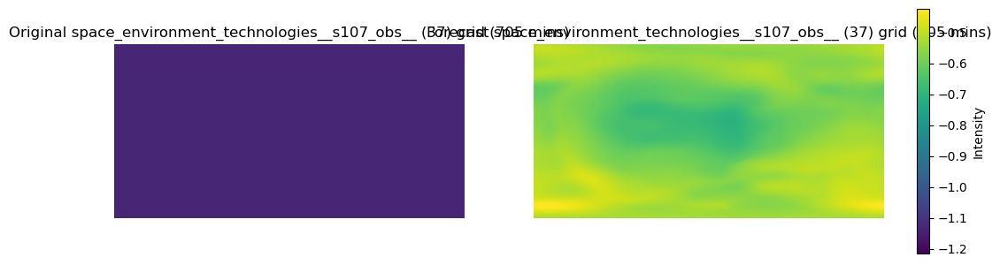

In [108]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter

# Display animations inline in Jupyter
from IPython.display import HTML
channel = 37
n_frames, n_channels, _, _ = combined_seq_original.shape
vmin = min(combined_seq_original[:, channel, :, :].min(), combined_seq_forecast[:, channel, :, :].min())
vmax = max(combined_seq_original[:, channel, :, :].max(), combined_seq_forecast[:, channel, :, :].max())
# Create figure and axis
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
x = np.linspace(0, 2*np.pi, 200)
im1 = ax1.imshow(np.zeros_like(combined_seq_original[0,0]), vmin=vmin, vmax=vmax, animated=True)
im2 = ax2.imshow(np.zeros_like(combined_seq_forecast[0,0]), vmin=vmin, vmax=vmax, animated=True)

ax1.set_title(f"Original {channel_names[channel]} ({channel}) grid ({0 * 15} mins)")
ax2.set_title(f"Forecast {channel_names[channel]} ({channel}) grid ({0 * 15} mins)")

for ax in (ax1, ax2):
    ax.axis("off")

# Add one shared colorbar (to the right of both subplots)
cbar = fig.colorbar(im1, ax=[ax1, ax2], orientation='vertical', fraction=0.025, pad=0.04, shrink=0.6)
cbar.set_label("Intensity")

# Update function for animation
def update(frame):
    # im1.set_array(combined_seq_original[frame, channel])
    im1.set_array(combined_seq_original[frame, channel])
    im2.set_array(combined_seq_forecast[frame, channel])

    ax1.set_title(f"Original {channel_names[channel]} ({channel}) grid ({frame * 15} mins)")
    ax2.set_title(f"Forecast {channel_names[channel]} ({channel}) grid ({frame * 15} mins)")
    return im1, im2    

# Create animation
ani = FuncAnimation(fig, update, frames=n_frames, interval=50, blit=True)

# --- save as GIF ---
import os 
target_folder = "/home/hert7450/2025-HL-Ionosphere/results/figures"
os.makedirs(target_folder, exist_ok=True)
save_path = os.path.join(target_folder, f"forecast_vs_original_{event_id}_{channel_names[channel]}_ch{channel}.gif")

# Use PillowWriter for GIF export
writer = PillowWriter(fps=7)  # you can adjust fps
ani.save(save_path, writer=writer)
print(f"Saved animation to {save_path}")


# Show animation inline
HTML(ani.to_jshtml())

In [51]:
channel_names[31]

'omniweb__speed__[km/s]'

  0%|          | 0/44 [00:00<?, ?it/s]

  2%|▏         | 1/44 [00:08<06:17,  8.79s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch0_forecast_vs_original_G0H12-201804202100_JPLD_TEC.gif



  5%|▍         | 2/44 [00:17<06:00,  8.59s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch1_forecast_vs_original_G0H12-201804202100_Sun_zenith_cos.gif



  7%|▋         | 3/44 [00:25<05:52,  8.61s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch2_forecast_vs_original_G0H12-201804202100_Sun_subsolar_lat_sin.gif



  9%|▉         | 4/44 [00:34<05:40,  8.52s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch3_forecast_vs_original_G0H12-201804202100_Sun_subsolar_lon_cos.gif



 11%|█▏        | 5/44 [00:42<05:32,  8.53s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch4_forecast_vs_original_G0H12-201804202100_Sun_subsolar_lon_sin.gif



 14%|█▎        | 6/44 [00:51<05:23,  8.52s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch5_forecast_vs_original_G0H12-201804202100_Sun_antipode_lat_sin.gif



 16%|█▌        | 7/44 [00:59<05:14,  8.49s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch6_forecast_vs_original_G0H12-201804202100_Sun_antipode_lon_cos.gif



 18%|█▊        | 8/44 [01:08<05:03,  8.43s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch7_forecast_vs_original_G0H12-201804202100_Sun_antipode_lon_sin.gif



 20%|██        | 9/44 [01:16<04:54,  8.40s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch8_forecast_vs_original_G0H12-201804202100_Earth-Sun_distance_(AU).gif



 23%|██▎       | 10/44 [01:24<04:44,  8.37s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch9_forecast_vs_original_G0H12-201804202100_Moon_zenith_cos.gif



 25%|██▌       | 11/44 [01:33<04:35,  8.36s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch10_forecast_vs_original_G0H12-201804202100_Moon_sublunar_lat_sin.gif



 27%|██▋       | 12/44 [01:41<04:26,  8.34s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch11_forecast_vs_original_G0H12-201804202100_Moon_sublunar_lon_cos.gif



 30%|██▉       | 13/44 [01:49<04:16,  8.28s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch12_forecast_vs_original_G0H12-201804202100_Moon_sublunar_lon_sin.gif



 32%|███▏      | 14/44 [01:57<04:10,  8.35s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch13_forecast_vs_original_G0H12-201804202100_Moon_antipode_lat_sin.gif



 34%|███▍      | 15/44 [02:05<03:55,  8.14s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch14_forecast_vs_original_G0H12-201804202100_Moon_antipode_lon_cos.gif



 36%|███▋      | 16/44 [02:15<03:58,  8.53s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch15_forecast_vs_original_G0H12-201804202100_Moon_antipode_lon_sin.gif



 39%|███▊      | 17/44 [02:23<03:49,  8.50s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch16_forecast_vs_original_G0H12-201804202100_Earth-Moon_distance_(LD).gif



 41%|████      | 18/44 [02:31<03:40,  8.50s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch17_forecast_vs_original_G0H12-201804202100_Day_of_year_sin.gif



 43%|████▎     | 19/44 [02:40<03:35,  8.61s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch18_forecast_vs_original_G0H12-201804202100_Day_of_year_cos.gif



 45%|████▌     | 20/44 [02:49<03:27,  8.66s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch19_forecast_vs_original_G0H12-201804202100_Quasi-dipole_lat_sin.gif



/var/tmp/ipykernel_65487/313148463.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
 48%|████▊     | 21/44 [02:58<03:17,  8.60s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch20_forecast_vs_original_G0H12-201804202100_Quasi-dipole_lat_cos.gif



 50%|█████     | 22/44 [03:06<03:09,  8.60s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch21_forecast_vs_original_G0H12-201804202100_Quasi-dipole_lon_sin.gif



 52%|█████▏    | 23/44 [03:15<02:59,  8.56s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch22_forecast_vs_original_G0H12-201804202100_Quasi-dipole_lon_cos.gif



 55%|█████▍    | 24/44 [03:23<02:49,  8.47s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch23_forecast_vs_original_G0H12-201804202100_Kp_index.gif



 57%|█████▋    | 25/44 [03:32<02:44,  8.67s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch24_forecast_vs_original_G0H12-201804202100_Ap_index.gif



 59%|█████▉    | 26/44 [03:41<02:37,  8.77s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch25_forecast_vs_original_G0H12-201804202100_omniweb__sym_d__[nT].gif



 61%|██████▏   | 27/44 [03:50<02:30,  8.84s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch26_forecast_vs_original_G0H12-201804202100_omniweb__sym_h__[nT].gif



 64%|██████▎   | 28/44 [03:59<02:21,  8.83s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch27_forecast_vs_original_G0H12-201804202100_omniweb__asy_d__[nT].gif



 66%|██████▌   | 29/44 [04:07<02:11,  8.74s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch28_forecast_vs_original_G0H12-201804202100_omniweb__bx_gse__[nT].gif



 68%|██████▊   | 30/44 [04:16<02:01,  8.67s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch29_forecast_vs_original_G0H12-201804202100_omniweb__by_gse__[nT].gif



 70%|███████   | 31/44 [04:25<01:52,  8.68s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch30_forecast_vs_original_G0H12-201804202100_omniweb__bz_gse__[nT].gif



 73%|███████▎  | 32/44 [04:33<01:43,  8.60s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch31_forecast_vs_original_G0H12-201804202100_omniweb__speed__[km_s].gif



 75%|███████▌  | 33/44 [04:42<01:36,  8.78s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch32_forecast_vs_original_G0H12-201804202100_omniweb__vx_velocity__[km_s].gif



 77%|███████▋  | 34/44 [04:52<01:29,  8.97s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch33_forecast_vs_original_G0H12-201804202100_omniweb__vy_velocity__[km_s].gif



 80%|███████▉  | 35/44 [05:01<01:21,  9.04s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch34_forecast_vs_original_G0H12-201804202100_omniweb__vz_velocity__[km_s].gif



 82%|████████▏ | 36/44 [05:10<01:11,  9.00s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch35_forecast_vs_original_G0H12-201804202100_space_environment_technologies__f107_obs__.gif



 84%|████████▍ | 37/44 [05:20<01:04,  9.24s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch36_forecast_vs_original_G0H12-201804202100_space_environment_technologies__f107_average__.gif



 86%|████████▋ | 38/44 [05:29<00:55,  9.17s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch37_forecast_vs_original_G0H12-201804202100_space_environment_technologies__s107_obs__.gif



 89%|████████▊ | 39/44 [05:37<00:45,  9.11s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch38_forecast_vs_original_G0H12-201804202100_space_environment_technologies__s107_average__.gif



 91%|█████████ | 40/44 [05:46<00:36,  9.03s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch39_forecast_vs_original_G0H12-201804202100_space_environment_technologies__m107_obs__.gif



 93%|█████████▎| 41/44 [05:55<00:27,  9.03s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch40_forecast_vs_original_G0H12-201804202100_space_environment_technologies__m107_average__.gif



 95%|█████████▌| 42/44 [06:05<00:18,  9.08s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch41_forecast_vs_original_G0H12-201804202100_space_environment_technologies__y107_obs__.gif



 98%|█████████▊| 43/44 [06:13<00:09,  9.01s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch42_forecast_vs_original_G0H12-201804202100_space_environment_technologies__y107_average__.gif



100%|██████████| 44/44 [06:22<00:00,  8.70s/it]

Saved animation to /home/hert7450/2025-HL-Ionosphere/results/figures/ch43_forecast_vs_original_G0H12-201804202100_JB08__d_st_dt__[K].gif


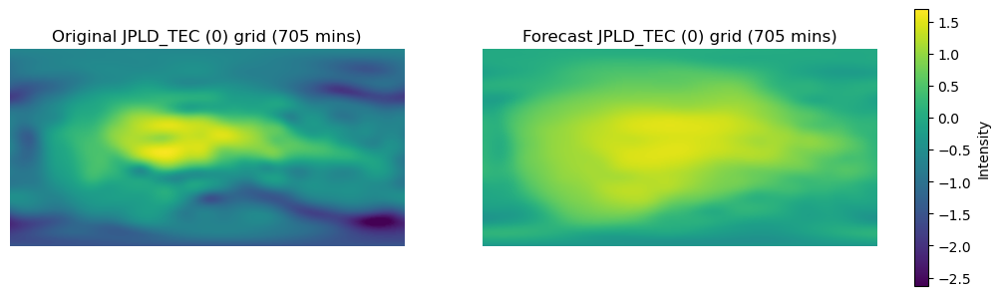

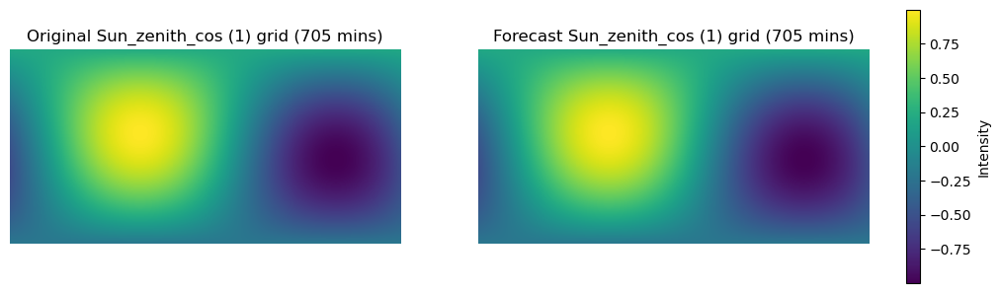

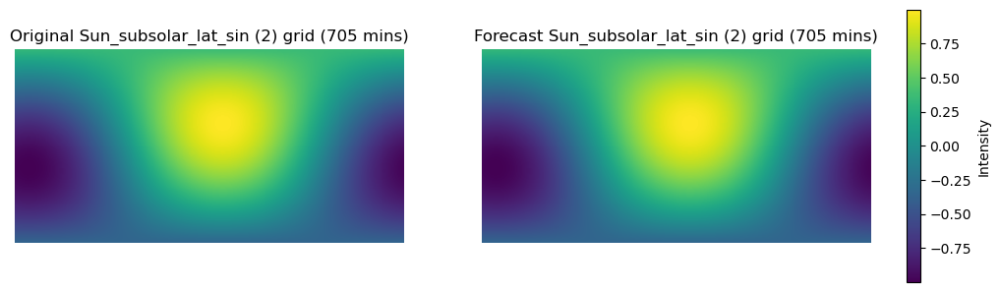

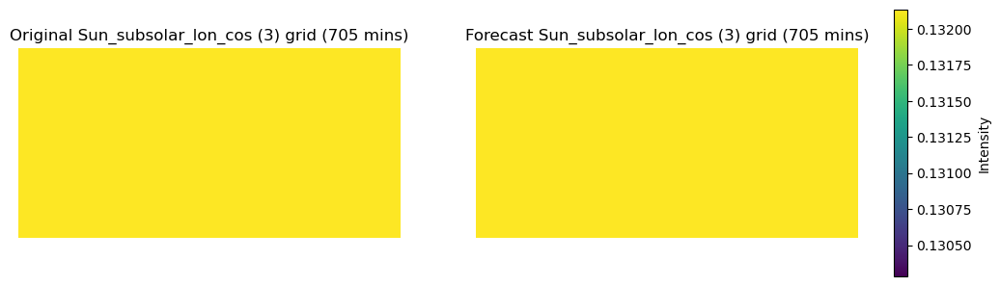

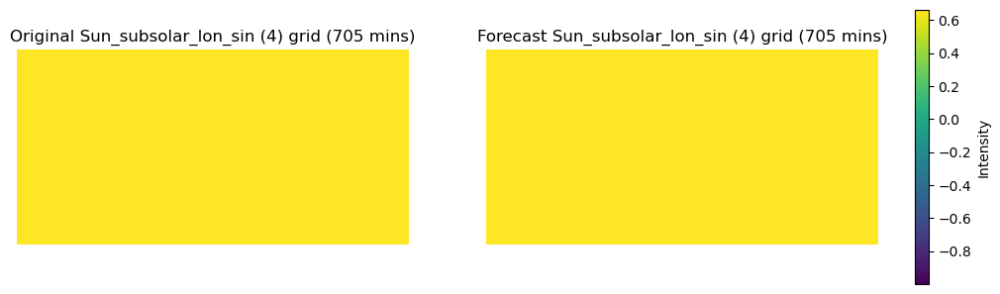

...

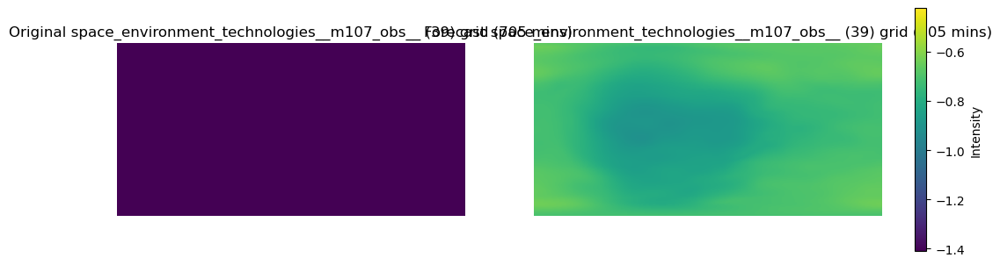

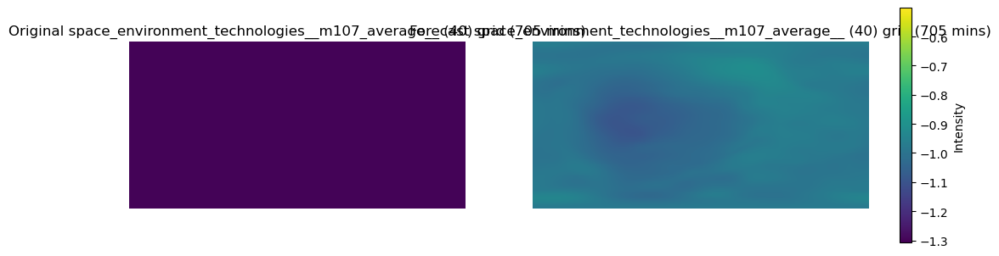

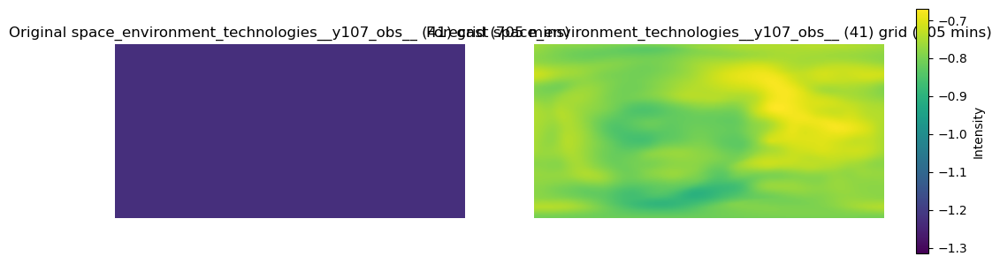

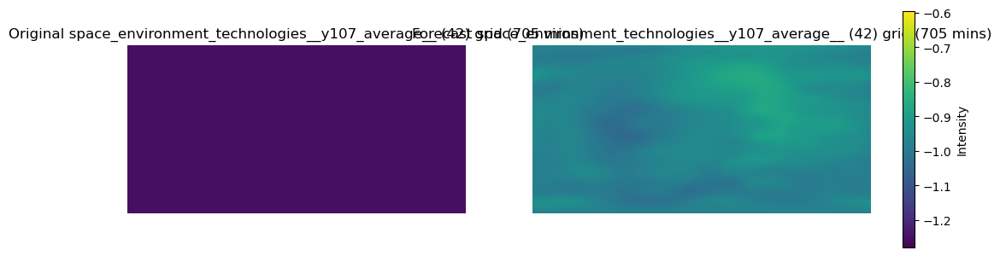

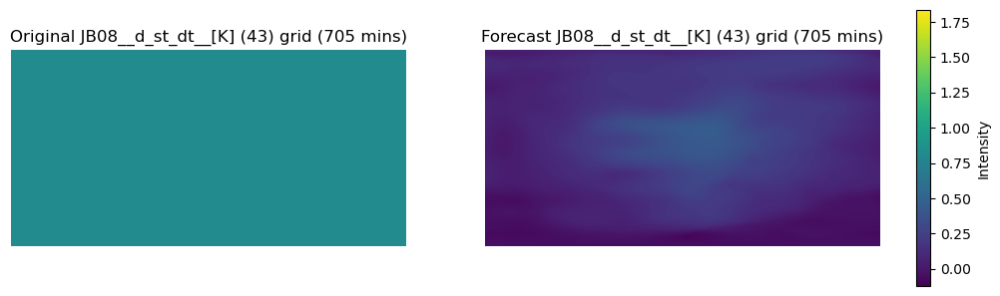

In [109]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from tqdm import tqdm
# Display animations inline in Jupyter
from IPython.display import HTML
import os 


for channel in tqdm(channels):
    target_folder = "/home/hert7450/2025-HL-Ionosphere/results/figures"
    os.makedirs(target_folder, exist_ok=True)
    save_path = os.path.join(target_folder, f"ch{channel}_forecast_vs_original_{event_id}_{channel_names[channel]}.gif")
    # if os.path.exists(save_path):
    #     print(f"Skipping channel {channel} as GIF already exists.", end="\r")
    #     continue
    print()
    n_frames, n_channels, _, _ = combined_seq_original.shape
    vmin = min(combined_seq_original[:, channel, :, :].min(), combined_seq_forecast[:, channel, :, :].min())
    vmax = max(combined_seq_original[:, channel, :, :].max(), combined_seq_forecast[:, channel, :, :].max())
    # Create figure and axis
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    x = np.linspace(0, 2*np.pi, 200)
    im1 = ax1.imshow(np.zeros_like(combined_seq_original[0,0]), vmin=vmin, vmax=vmax, animated=True)
    im2 = ax2.imshow(np.zeros_like(combined_seq_forecast[0,0]), vmin=vmin, vmax=vmax, animated=True)

    ax1.set_title(f"Original {channel_names[channel]} ({channel}) grid ({0 * 15} mins)")
    ax2.set_title(f"Forecast {channel_names[channel]} ({channel}) grid ({0 * 15} mins)")

    for ax in (ax1, ax2):
        ax.axis("off")

    # Add one shared colorbar (to the right of both subplots)
    cbar = fig.colorbar(im1, ax=[ax1, ax2], orientation='vertical', fraction=0.025, pad=0.04, shrink=0.6)
    cbar.set_label("Intensity")

    # Update function for animation
    def update(frame):
        # im1.set_array(combined_seq_original[frame, channel])
        im1.set_array(combined_seq_original[frame, channel])
        im2.set_array(combined_seq_forecast[frame, channel])

        ax1.set_title(f"Original {channel_names[channel]} ({channel}) grid ({frame * 15} mins)")
        ax2.set_title(f"Forecast {channel_names[channel]} ({channel}) grid ({frame * 15} mins)")
        return im1, im2    

    # Create animation
    ani = FuncAnimation(fig, update, frames=n_frames, interval=50, blit=True)

    # --- save as GIF ---

    # Use PillowWriter for GIF export
    writer = PillowWriter(fps=7)  # you can adjust fps
    ani.save(save_path, writer=writer)
    print(f"Saved animation to {save_path}")


# Show animation inline
HTML(ani.to_jshtml())

In [58]:
combined_seq_original_average = combined_seq_original.mean(axis=(2,3))
combined_seq_forecast_average = combined_seq_forecast.mean(axis=(2,3))

In [64]:
seq_len, n_channels, H, W = combined_seq_original.shape
print(combined_seq_original.shape, combined_seq_forecast.shape)
print(combined_seq_original_average.shape, combined_seq_forecast_average.shape)
print(combined_seq_original.reshape(seq_len, n_channels, H*W).shape, combined_seq_forecast.reshape(seq_len, n_channels, H*W).shape)


(48, 44, 180, 360) (48, 44, 180, 360)
(48, 44) (48, 44)
(48, 44, 64800) (48, 44, 64800)


In [65]:
180*360

64800

In [77]:
CELESTRAK.tolist() + OMNI.tolist() + SET.tolist()

[23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43]

[25684 18266 23736  9773 50438 32655 21661 58605 12469  3935 15114 17234
 26217 13850 37327 39955  6761  2996 55957 18721 39989 52277 54188 50654
  5202 17714 53749  2517  5634 28493 11346 13195 18299 39655 36421 31451
 32581 27625  7859 31809   963 53991 57122 53565 20514 52508 53769 60561
 11876 25685 63161 19041 60203 11037 31766 49320 13372 54554  5629 54287
 11997 33929 20978  5752 52773 24881  6649 18960 53527 61120 32877 57726
 30982 11425 61719 34868 24887 59922  9749  3891  8049 36828 18389 30336
 28325 60108  7807 57706 43613 43538 52231 50325 23947 12389 50159 19078
 55886 42789 13042 50532]


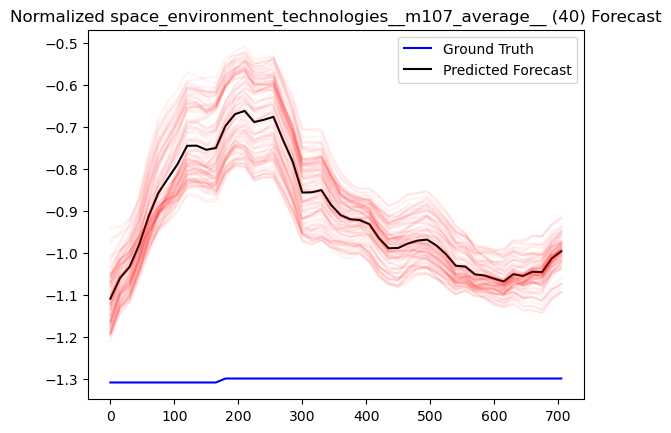

In [99]:

channel = np.random.choice(CELESTRAK.tolist() + OMNI.tolist() + SET.tolist())




seq_len, n_channels, H, W = combined_seq_original.shape
# vmin = min(combined_seq_original[:, channel, :, :].min(), combined_seq_forecast[:, channel, :, :].min())
# vmax = min(combined_seq_original[:, channel, :, :].max(), combined_seq_forecast[:, channel, :, :].max())
# Create figure and axis

samples = np.random.randint(0, H*W, size=100)
print(samples)
sampled_forecasts = combined_seq_forecast.reshape(seq_len, n_channels, H*W)[:, channel, samples]
average_forecasts = combined_seq_forecast_average[:, channel]
ground_truth = combined_seq_original[:, channel, 0, 0] # This only makes sense for global params
timestamps = np.arange(seq_len) * 15  # in minutes

plt.plot(timestamps, ground_truth, label="Ground Truth", color="blue")
plt.plot(timestamps, average_forecasts, label="Predicted Forecast", color="black")
plt.plot(timestamps, sampled_forecasts, color="red", alpha=0.05)
plt.title(f"Normalized {channel_names[channel]} ({channel}) Forecast")
plt.legend()
plt.show()

In [105]:
for channel in tqdm(CELESTRAK.tolist() + OMNI.tolist() + SET.tolist()):

    seq_len, n_channels, H, W = combined_seq_original.shape


    samples = np.random.randint(0, H*W, size=100)
    # print(samples)
    sampled_forecasts = combined_seq_forecast.reshape(seq_len, n_channels, H*W)[:, channel, samples]
    average_forecasts = combined_seq_forecast_average[:, channel]
    ground_truth = combined_seq_original[:, channel, 0, 0] # This only makes sense for global params
    timestamps = np.arange(seq_len) * 15  # in minutes

    plt.plot(timestamps, ground_truth, label="Ground Truth", color="blue")
    plt.plot(timestamps, average_forecasts, label="Predicted Forecast", color="black")
    plt.plot(timestamps, sampled_forecasts, color="red", alpha=0.05)
    plt.title(f"Normalized {channel_names[channel]} ({channel}) Forecast")
    plt.legend()
    plt.savefig(f"/home/hert7450/2025-HL-Ionosphere/results/figures/globals_ch{channel}_forecast_vs_original_{event_id}_{channel_names[channel]}.png")
    
    plt.clf()

100%|██████████| 21/21 [00:05<00:00,  3.72it/s]


<Figure size 640x480 with 0 Axes>